In [56]:
import scanpy as sc
import pandas as pd
import celltypist
from celltypist import models

import re

In [2]:
# Load megagut object
adata = sc.read_h5ad("/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/pooled_healthy_disease.remapped.allgenes.fine_annot.no_doublets.20230322.h5ad")

In [3]:
adata

AnnData object with n_obs × n_vars = 1358576 × 36601
    var: 'gene_ids', 'feature_type', 'mito', 'ribo', 'hb', 'cc', 'ig', 'tcr', 'n_counts-0', 'n_counts_raw-0', 'n_counts_spliced-0', 'n_counts_unspliced-0', 'n_cells-0', 'n_cells_raw-0', 'n_cells_spliced-0', 'n_cells_unspliced-0', 'n_counts-1', 'n_counts_raw-1', 'n_counts_spliced-1', 'n_counts_unspliced-1', 'n_cells-1', 'n_cells_raw-1', 'n_cells_spliced-1', 'n_cells_unspliced-1'
    uns: 'age_unified_colors', 'control_vs_disease_colors', 'disease_colors', 'level_1_annot_colors', 'level_3_annot_colors', 'neighbors', 'organ_groups_colors', 'organ_unified_colors', 'study_colors', 'umap'
    obsm: 'X_mde', 'X_scANVI', 'X_umap', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

In [4]:
# parse metadata
adata.obs = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/pooled_healthy_disease.remapped.allgenes.fine_annot.no_doublets.20230322.csv',index_col=0)

/tmp/ipykernel_219/2974779274.py:2: DtypeWarning: Columns (73,82,83,84,86,93,102,105,112,113,114,115,117,119) have mixed types. Specify dtype option on import or set low_memory=False.
  adata.obs = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/pooled_healthy_disease.remapped.allgenes.fine_annot.no_doublets.20230322.csv',index_col=0)


In [5]:
adata

AnnData object with n_obs × n_vars = 1358576 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_s

In [374]:
#print(adata.X[1:20, 1:20])

In [7]:
# Normalize megagut
sc.pp.normalize_per_cell(adata, counts_per_cell_after=10000)

# Pseudo log transform
sc.pp.log1p(adata)

In [375]:
#print(adata.X[1:20, 1:20])

In [9]:
# Load celltypist models of fibroblasts
model = models.Model.load("celltypist/friedrich_fibroblasts.pkl")

In [13]:
model

CellTypist model with 9 cell types and 1419 features
    date: 2024-08-08 16:17:22.262069
    cell types: MF1, MF2, ..., S5
    features: SAMD11, HES4, ..., MT-CO3

## Explore fibroblast marker genes in megagut atlas

In [75]:
# marker_dict = {
#     'S1': ['CCL11', 'CCL8', 'CCL13', 'COL6A5', 'MYH13', 'CXXC4', 'ADAMDEC1', 'CXCL14', 'ABCA8', 'CTSC'],
#     'S2': ['PDGFRA', 'SOX6', 'F3', 'SOX1', 'F2R', 'PRSS2', 'VSTM2A', 'PDGFD', 'BMP3', 'COL4A5'],
#     'S3': ['GREM1', 'IGF1', 'TMEFF2', 'IGFN1', 'TNN', 'SERTM2', 'IL20RA', 'DCX', 'MROH2B', 'C7'],
#     'S3x': ['MFAP5', 'PI16', 'IL18', 'PLA2G2A', 'ACKR4', 'WNT11', 'CD34', 'CD248', 'CD55'],
#     'S4': ['CCL19', 'CCL21', 'CD74', 'CXCL13', 'TNFSF13B', 'HLA-DRB5', 'FDCSP', 'HLA-DQA1', 'HLA-DQB1', 'CXCL9'],
#     'S5': ['MMP1', 'MMP3', 'MMP9', 'SAA1', 'CXCL5', 'CXCL6', 'CXCL8', 'IL11', 'FAP', 'PDPN'],
#     'MF1': ['HHIP', 'MYH11', 'ACTA2', 'ACTG2', 'PDGFC', 'MYLK', 'SOSTDC1', 'DIRAS2', 'CHMP4C', 'MYOCD'],
#     'MF2': ['DES', 'SPEG', 'MYL6', 'CNN1', 'TAGLN', 'MYL9', 'TPM1', 'TPM2', 'DSTN', 'ACTB'],  # MYLK6: SPEG
#     'PC': ['PDGFRB', 'RGS5', 'MCAM', 'NOTCH3', 'HIGD1B', 'KCNA5', 'CD36', 'WNT6', 'PDGFB', 'PDGFA']
# }

# plot = sc.pl.dotplot(adata, marker_dict, groupby = 'level_3_annot', swap_axes = True, standard_scale = 'var', figsize = [26, 16], return_fig=True)
# plot.add_totals()
# plot.show()

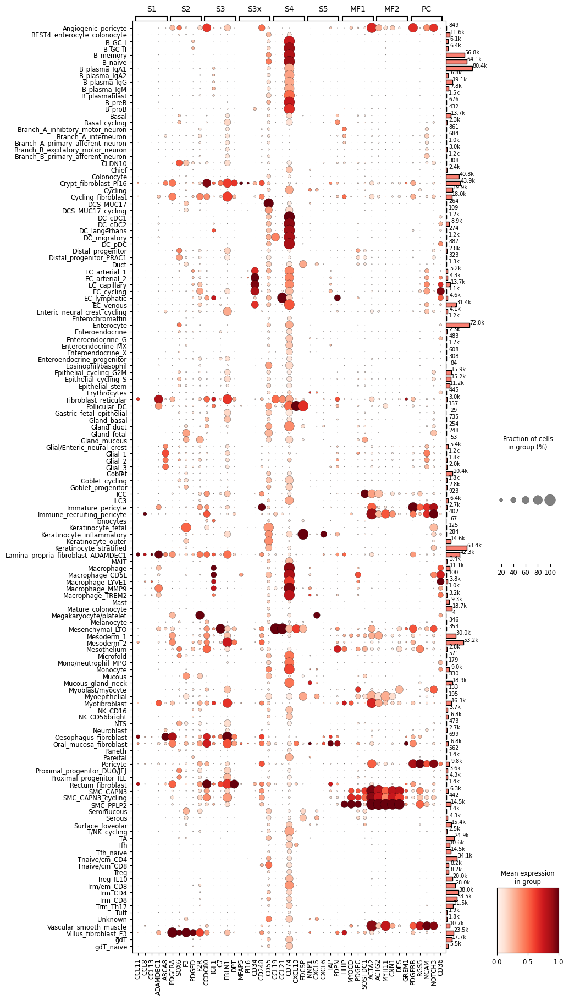

In [79]:
marker_dict = {
    'S1': ['CCL11', 'CCL8', 'CCL13', 'ADAMDEC1', 'ABCA8'],
    'S2': ['PDGFRA', 'SOX6', 'F3', 'PDGFD', 'F2R'],
    'S3': ['CCDC80', 'IGF1',  'C7', 'FBLN1', 'DPT'],
    'S3x': ['MFAP5', 'PI16', 'CD34', 'CD248', 'CD55'],
    'S4': ['CCL19', 'CCL21', 'CD74', 'CXCL13', 'FDCSP'],
    'S5': ['MMP1', 'CXCL5', 'CXCL6', 'FAP', 'PDPN'],
    'MF1': ['HHIP', 'MYOCD', 'PDGFC',  'SOSTDC1', 'ACTA2'],
    'MF2': ['ACTG2', 'MYH11', 'CNN1', 'DES', 'GREM1'],
    'PC': ['PDGFRB', 'RGS5', 'MCAM', 'NOTCH3', 'CD36']
}

plot = sc.pl.dotplot(
    adata, marker_dict, groupby = 'level_3_annot',
    swap_axes = False,
    standard_scale = 'var',
    figsize = [10, 22],
    return_fig=True)
plot.add_totals()
plot.show()

## Define fibroblast cell types

In [55]:
# Search for fibroblast cell types
fibroblasts = filter(lambda x: re.search(r'fibro', x), adata.obs.level_3_annot.cat.categories)
fibroblasts = list(fibroblasts)
fibroblasts

['Crypt_fibroblast_PI16',
 'Cycling_fibroblast',
 'Lamina_propria_fibroblast_ADAMDEC1',
 'Myofibroblast',
 'Oesophagus_fibroblast',
 'Oral_mucosa_fibroblast',
 'Rectum_fibroblast',
 'Villus_fibroblast_F3']

In [139]:
# expand fibroblasts with level_2 annotated cell types
extra_fibroblasts = set(
    adata.obs.level_3_annot[
        adata.obs.level_2_annot.isin(["Fibroblast", "Smooth_muscle", "Myofibroblast", "Pericyte"])
    ]
)

In [140]:
# Append new cell types identified
fibroblasts = list(set(fibroblasts + list(extra_fibroblasts)))

In [141]:
adata[adata.obs.level_3_annot.isin(fibroblasts)]

View of AnnData object with n_obs × n_vars = 198594 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_coun

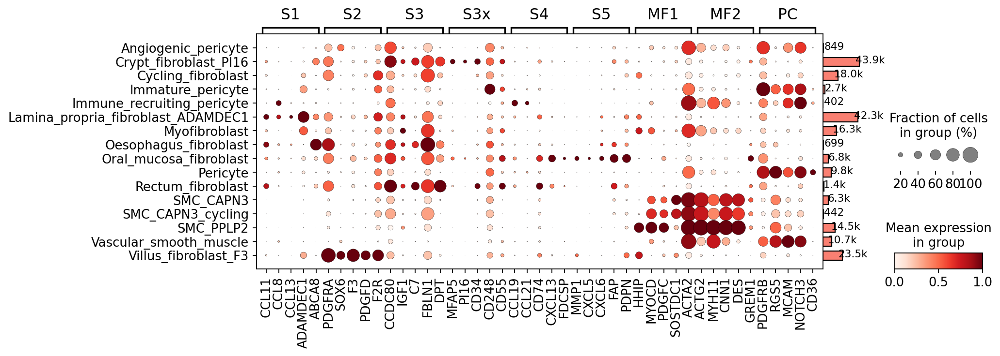

In [586]:
# dotplot of fibroblasts only
marker_dict = {
    'S1': ['CCL11', 'CCL8', 'CCL13', 'ADAMDEC1', 'ABCA8'],
    'S2': ['PDGFRA', 'SOX6', 'F3', 'PDGFD', 'F2R'],
    'S3': ['CCDC80', 'IGF1',  'C7', 'FBLN1', 'DPT'],
    'S3x': ['MFAP5', 'PI16', 'CD34', 'CD248', 'CD55'],
    'S4': ['CCL19', 'CCL21', 'CD74', 'CXCL13', 'FDCSP'],
    'S5': ['MMP1', 'CXCL5', 'CXCL6', 'FAP', 'PDPN'],
    'MF1': ['HHIP', 'MYOCD', 'PDGFC',  'SOSTDC1', 'ACTA2'],
    'MF2': ['ACTG2', 'MYH11', 'CNN1', 'DES', 'GREM1'],
    'PC': ['PDGFRB', 'RGS5', 'MCAM', 'NOTCH3', 'CD36']
}

plot = sc.pl.dotplot(
    adata[adata.obs.level_3_annot.isin(fibroblasts)],
    marker_dict,
    groupby = 'level_3_annot',                 
    swap_axes = False,
    standard_scale = 'var',
    figsize = [12, 4],                     
    return_fig=True)
plot.add_totals()
#plot.show()

plot.savefig("figures/dotplot_megagut_annotation_fibro_markers.pdf")

In [146]:
# adata.obs.level_2_annot.value_counts()

In [145]:
# # fibroblasst only
# # selection by level 2 annotation
# marker_dict = {
#     'S1': ['CCL11', 'CCL8', 'CCL13', 'ADAMDEC1', 'ABCA8'],
#     'S2': ['PDGFRA', 'SOX6', 'F3', 'PDGFD', 'F2R'],
#     'S3': ['CCDC80', 'IGF1',  'C7', 'FBLN1', 'DPT'],
#     'S3x': ['MFAP5', 'PI16', 'CD34', 'CD248', 'CD55'],
#     'S4': ['CCL19', 'CCL21', 'CD74', 'CXCL13', 'FDCSP'],
#     'S5': ['MMP1', 'CXCL5', 'CXCL6', 'FAP', 'PDPN'],
#     'MF1': ['HHIP', 'MYOCD', 'PDGFC',  'SOSTDC1', 'ACTA2'],
#     'MF2': ['ACTG2', 'MYH11', 'CNN1', 'DES', 'GREM1'],
#     'PC': ['PDGFRB', 'RGS5', 'MCAM', 'NOTCH3', 'CD36']
# }

# plot = sc.pl.dotplot(
#     adata[adata.obs.level_2_annot.isin(["Fibroblast", "Smooth_muscle", "Myofibroblast", "Pericyte"])],
#     marker_dict,
#     groupby = 'level_3_annot',                 
#     swap_axes = False,
#     standard_scale = 'var',
#     figsize = [12, 4],
#     #dendrogram=True,
#     #use_rep="X_umap",
#     return_fig=True)
# plot.add_totals()
# plot.show()

## Run CellTypist on megagut atlas

In [376]:
# WARNING: long runtime on entire megagut object
#predictions = celltypist.annotate(adata, model = model, majority_voting = True, mode = 'prob match', p_thres = 0.5)

In [81]:
#predictions

In [147]:
#adata_sub = adata[adata.obs.level_2_annot.isin(["Fibroblast", "Smooth_muscle", "Myofibroblast", "Pericyte"])]

adata_sub = adata[adata.obs.level_3_annot.isin(fibroblasts)]

adata_sub

View of AnnData object with n_obs × n_vars = 198594 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_coun

In [148]:
# Run celltypist on subset of data
predictions = celltypist.annotate(
    adata_sub,
    model = model,
    majority_voting = True,
    mode = 'prob match',
    p_thres = 0.5)

🔬 Input data has 198594 cells and 36601 genes
🔗 Matching reference genes in the model
🧬 1402 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 25
🗳️ Majority voting the predictions
✅ Majority voting done!


In [149]:
predictions

CellTypist prediction result for 198594 query cells
    predicted_labels: data frame with 3 columns ('predicted_labels', 'over_clustering', 'majority_voting')
    decision_matrix: data frame with 198594 query cells and 9 cell types
    probability_matrix: data frame with 198594 query cells and 9 cell types
    adata: AnnData object referred

In [377]:
#adata_sub

In [264]:
# Add celltypist results to AnnData object
# Columns: 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1', 'MF2', 'PC', 'S1', 'S2', 'S3', 'S3x', 'S4', 'S5'
adata_sub = predictions.to_adata(insert_prob=True)

In [493]:
subtypes = ['MF1', 'MF2', 'PC', 'S1', 'S2', 'S3', 'S3x', 'S4', 'S5']

#{x: x + "_prob" for x in subtypes}

In [313]:
# rename probability columns
adata_sub.obs = adata_sub.obs.rename(columns={x: x + "_prob" for x in subtypes})

# Subset data to fibroblasts

In [265]:
adata_sub

AnnData object with n_obs × n_vars = 198594 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [152]:
adata.obs.disease.value_counts()

disease
control                   489029
inutero                   333624
neighbouring_cancer       152292
cancer_gastric            101594
neighbouring_inflammed     77136
pediatric_IBD              67092
crohns_disease             48074
ulcerative_colitis         35891
cancer_colorectal          28684
neighbouring_polyps        15648
preterm                     9512
Name: count, dtype: int64

In [153]:
adata_sub.obs.disease.value_counts()

disease
inutero                   121613
control                    49660
neighbouring_cancer         7185
ulcerative_colitis          5312
cancer_gastric              4375
cancer_colorectal           3645
pediatric_IBD               3227
crohns_disease              1160
neighbouring_polyps         1094
preterm                      832
neighbouring_inflammed       491
Name: count, dtype: int64

In [155]:
# why no fibroblasts for Crohn's disease or UC?

#pd.set_option('display.max_rows', 100)

#adata[adata.obs.disease.isin(["crohns_disease"])].obs.level_3_annot.value_counts()

In [378]:
#adata[adata.obs.disease.isin(["crohns_disease"])].obs.level_2_annot.value_counts()

# Recompute UMAP on fibroblast subset

In [156]:
sc.pp.neighbors(adata_sub, use_rep="X_scANVI")

In [157]:
sc.tl.umap(adata_sub)

In [514]:
# Set figure size
from matplotlib import rcParams

#rcParams["figure.figsize"] = (4, 4)

sc.set_figure_params(dpi_save=300, figsize=(4, 4))

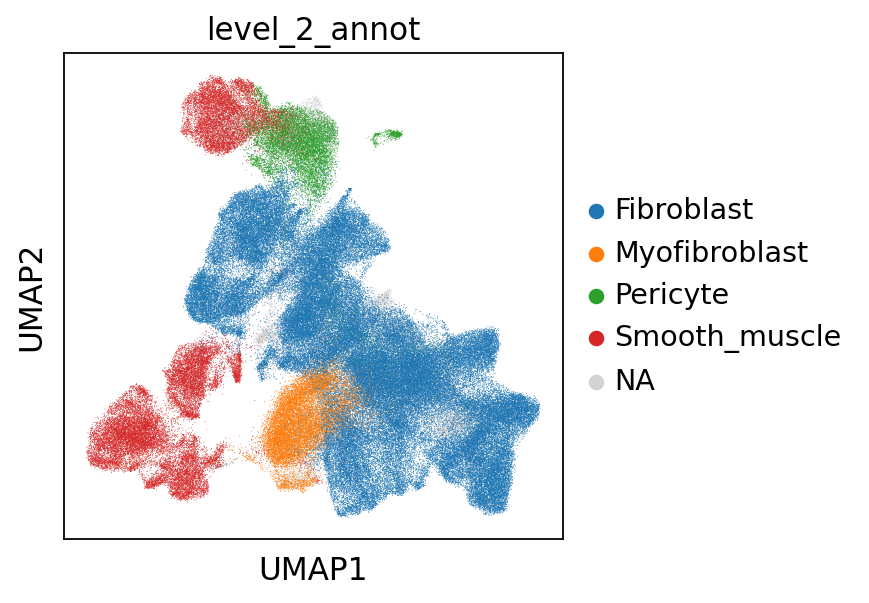

In [516]:
sc.pl.umap(adata_sub, color=["level_2_annot"])

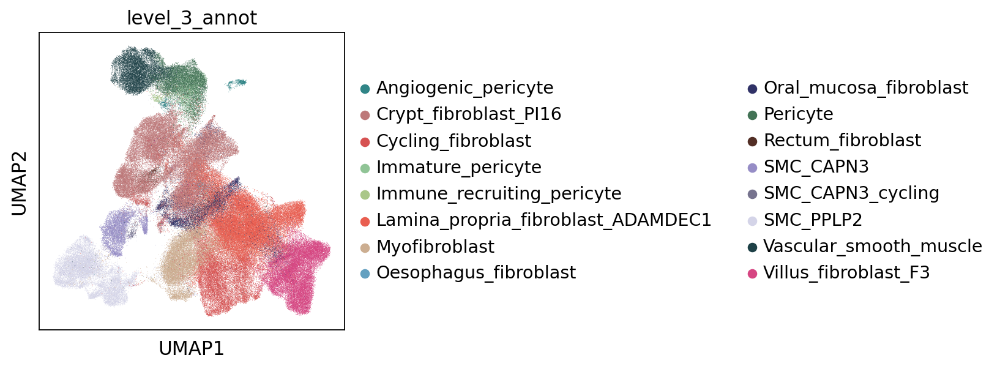

In [515]:
sc.pl.umap(adata_sub, color=["level_3_annot"], save="_megagut_level3annot_fibro")

In [171]:
#sc.pl.umap(adata_sub, color=["fine_annot"])

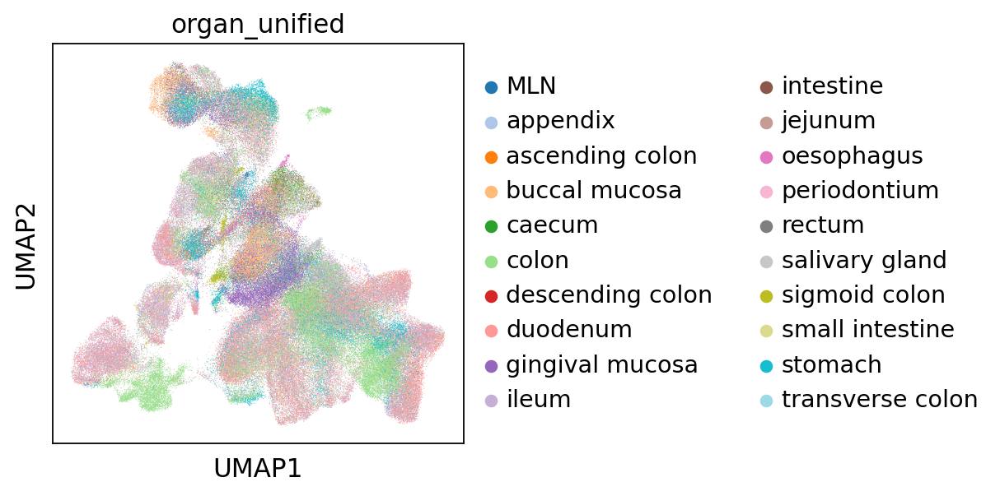

In [517]:
sc.pl.umap(adata_sub, color=["organ_unified"], palette="tab20", save="_megagut_organ_fibro")

In [170]:
#sc.pl.umap(adata_sub, color=["disease"])

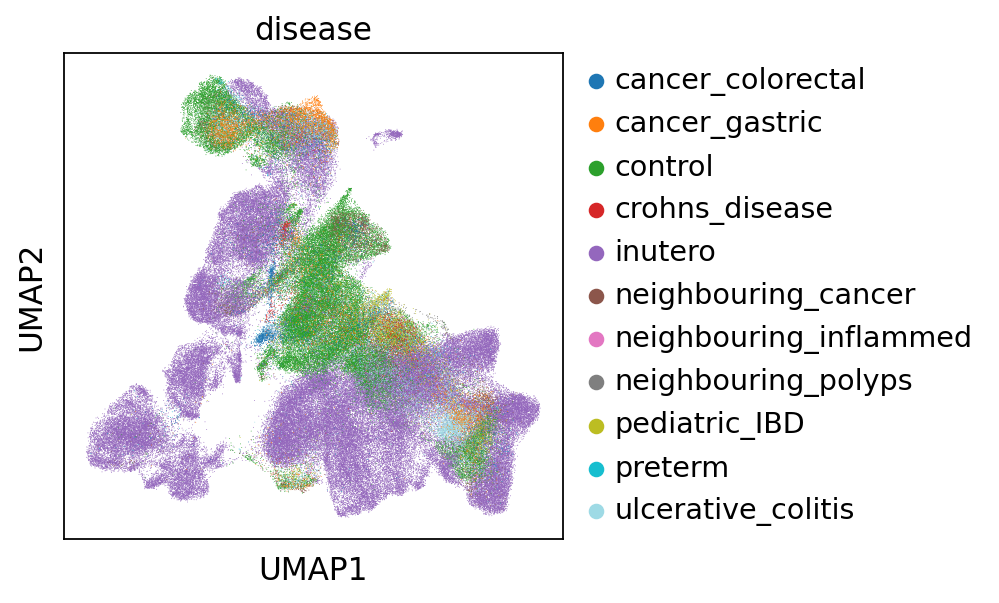

In [518]:
sc.pl.umap(adata_sub, color=["disease"], palette="tab20", save="_megagut_disease_fibro")

In [167]:
#sc.pl.umap(adata_sub, color=["control_vs_disease"])

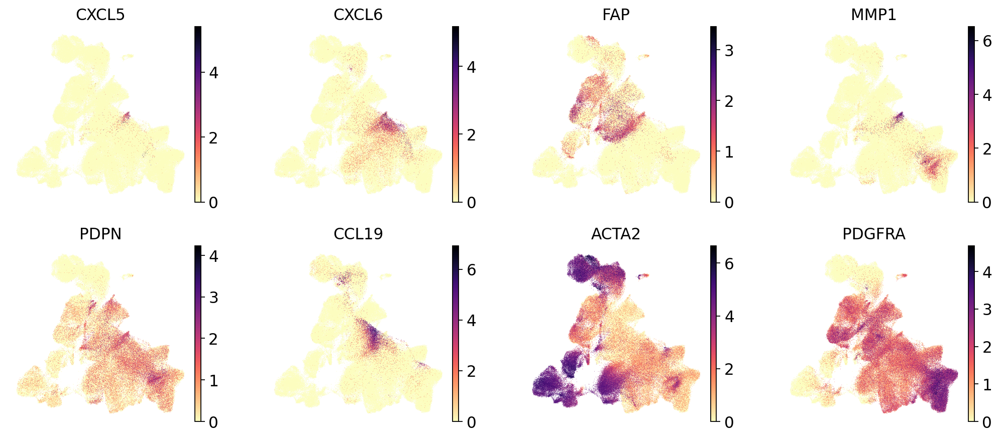

In [520]:
rcParams["figure.figsize"] = (3, 3)
sc.pl.umap(
    adata_sub,
    color=["CXCL5", "CXCL6", "FAP", "MMP1", "PDPN", "CCL19", "ACTA2", "PDGFRA"],
    color_map="magma_r",
    frameon=False,
    save="_megagut_markers_fibro"
)

In [178]:
adata_sub

AnnData object with n_obs × n_vars = 198594 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [ ]:
# Visualize celltypist results

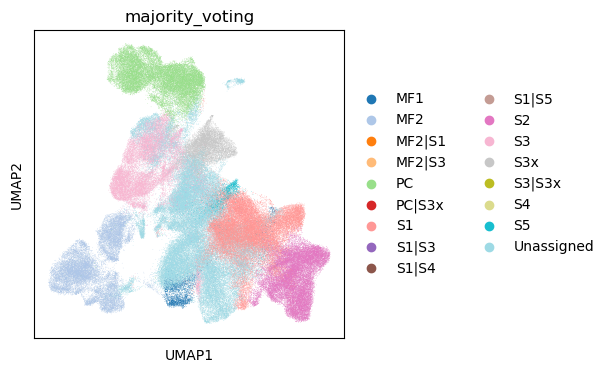

In [340]:
rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata_sub, color=["majority_voting"], palette="tab20")

In [341]:
# Define '|' as unassigned to clear up visual representation
adata_sub.obs['majority_voting_clear'] = adata_sub.obs.majority_voting.astype(str)

In [342]:
adata_sub.obs.majority_voting_clear[adata_sub.obs.majority_voting_clear.str.contains("\|")] = 'Unassigned'

/tmp/ipykernel_219/3015899964.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_sub.obs.majority_voting_clear[adata_sub.obs.majority_voting_clear.str.contains("\|")] = 'Unassigned'


In [343]:
adata_sub.obs.majority_voting_clear[adata_sub.obs.majority_voting_clear == 'Unassigned'] = pd.NA

/tmp/ipykernel_219/3507531382.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_sub.obs.majority_voting_clear[adata_sub.obs.majority_voting_clear == 'Unassigned'] = pd.NA


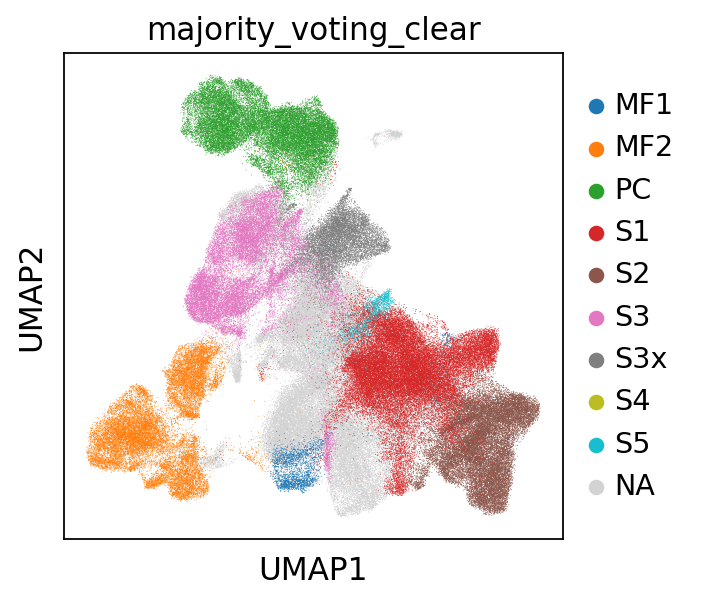

In [522]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(adata_sub, color=["majority_voting_clear"], palette="tab10", save="_megagut_fibro_celltypist")

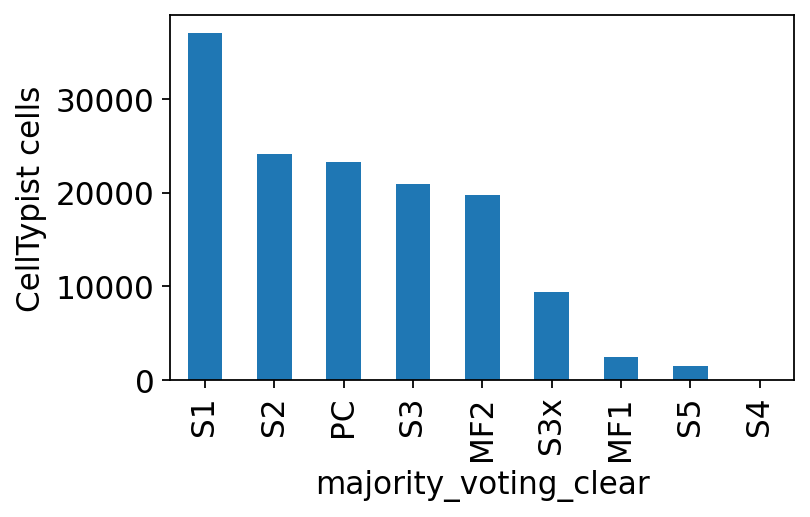

In [610]:
rcParams["figure.figsize"] = (5, 3)

ax = adata_sub.obs.majority_voting_clear.value_counts().plot.bar()
ax.grid(False)
ax.set_ylabel("CellTypist cells")
plt.savefig("figures/barplot_celltypist_megagut_all_majority_voting.pdf", bbox_inches='tight')

In [611]:
adata_sub.obs.majority_voting_clear.value_counts()

majority_voting_clear
S1     37058
S2     24138
PC     23267
S3     20915
MF2    19773
S3x     9442
MF1     2464
S5      1497
S4         2
Name: count, dtype: int64

In [354]:
#adata_sub

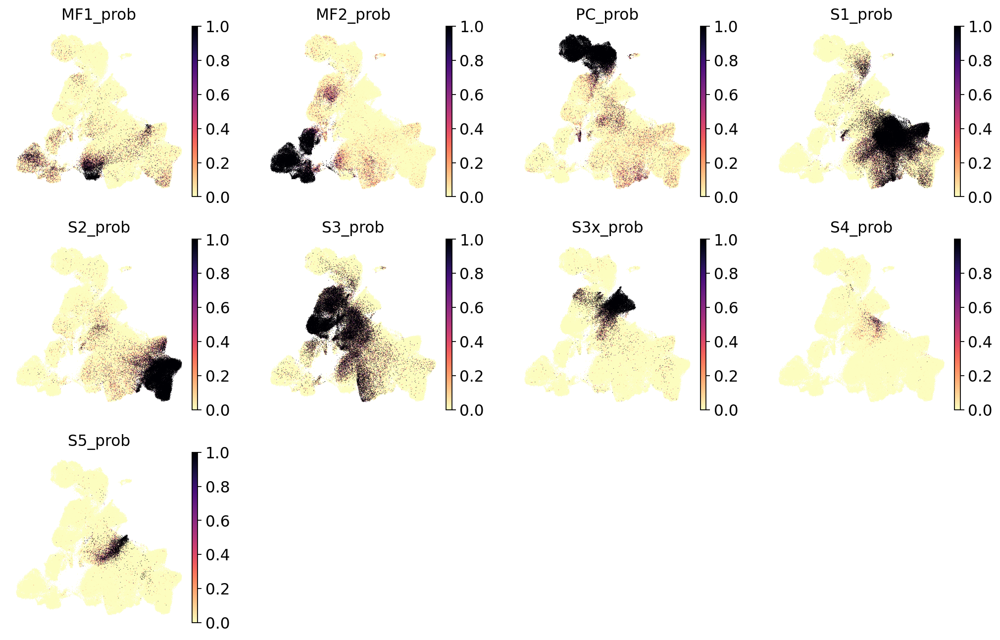

In [527]:
# Plot probabilitites
rcParams["figure.figsize"] = (3, 3)
sc.pl.umap(adata_sub, color=[x + "_prob" for x in subtypes], color_map="magma_r", frameon=False, size=1, save="_megagut_fibro_celltypist_probs")

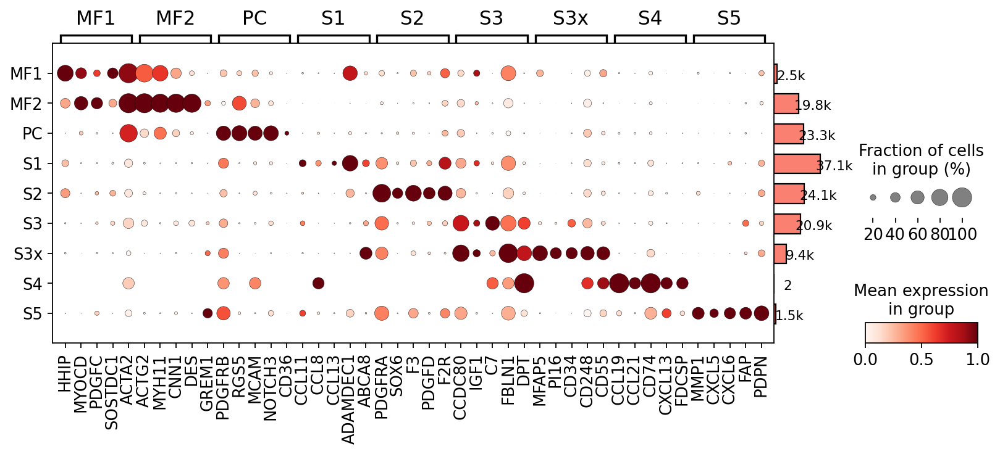

In [618]:
# dotplot of fibroblasts called by CellTYpist
marker_dict = {
    'MF1': ['HHIP', 'MYOCD', 'PDGFC',  'SOSTDC1', 'ACTA2'],
    'MF2': ['ACTG2', 'MYH11', 'CNN1', 'DES', 'GREM1'],
    'PC': ['PDGFRB', 'RGS5', 'MCAM', 'NOTCH3', 'CD36'],
    'S1': ['CCL11', 'CCL8', 'CCL13', 'ADAMDEC1', 'ABCA8'],
    'S2': ['PDGFRA', 'SOX6', 'F3', 'PDGFD', 'F2R'],
    'S3': ['CCDC80', 'IGF1',  'C7', 'FBLN1', 'DPT'],
    'S3x': ['MFAP5', 'PI16', 'CD34', 'CD248', 'CD55'],
    'S4': ['CCL19', 'CCL21', 'CD74', 'CXCL13', 'FDCSP'],
    'S5': ['MMP1', 'CXCL5', 'CXCL6', 'FAP', 'PDPN']
}

plot = sc.pl.dotplot(
    adata_sub,
    marker_dict,
    groupby = 'majority_voting_clear',                 
    swap_axes = False,
    standard_scale = 'var',
    figsize = [12, 4],                     
    return_fig=True)
plot.add_totals()
#plot.show()

plot.savefig("figures/dotplot_megagut_annotation_fibro_markers_celltypist.pdf")

In [356]:
adata_sub[adata_sub.obs.majority_voting == 'S5']

View of AnnData object with n_obs × n_vars = 1497 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts

In [538]:
import matplotlib.pyplot as plt

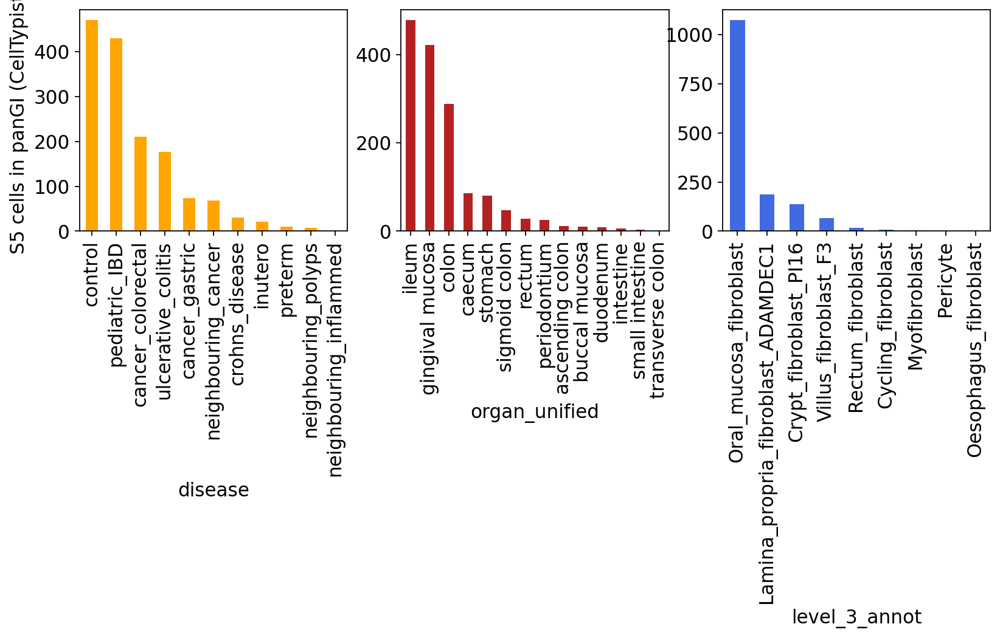

In [588]:
rcParams["figure.figsize"] = (12, 3)

fig, axs = plt.subplots(1, 3)

adata_sub[adata_sub.obs.majority_voting == 'S5'].obs.disease.value_counts().plot(kind='bar', ax=axs[0], color='orange')
axs[0].set_ylabel("S5 cells in panGI (CellTypist)")

adata_sub[adata_sub.obs.majority_voting == 'S5'].obs.organ_unified.value_counts().plot(kind='bar', ax=axs[1], color='firebrick')

adata_sub[adata_sub.obs.majority_voting == 'S5'].obs.level_3_annot.value_counts().plot(kind='bar', ax=axs[2], color='royalblue')

# style formatting
for ax in axs:
    ax.grid(False)
    
fig.savefig("figures/barplot_megagut_S5_distributions.pdf", bbox_inches='tight')

## what are S5 controls?

In [631]:
adata_sub

AnnData object with n_obs × n_vars = 198594 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [632]:
adata_sub_S5 = adata_sub[(adata_sub.obs.majority_voting == 'S5')]

In [634]:
sc.pp.neighbors(adata_sub_S5, use_rep='X_scANVI')

In [635]:
sc.tl.umap(adata_sub_S5)


In [646]:
adata_sub_S5

AnnData object with n_obs × n_vars = 1497 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

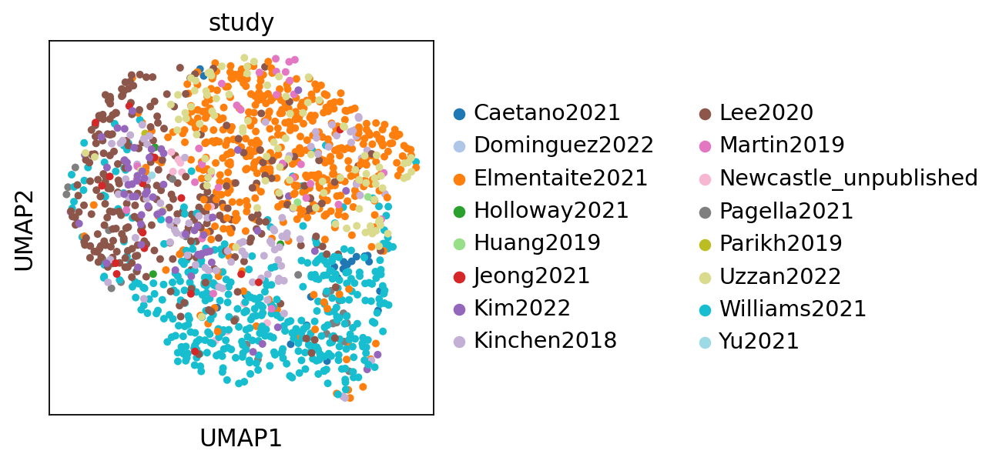

In [650]:

#Set up color schemes
sc.pl.umap(
    adata_sub_S5,
    color="study", palette='tab20'
)

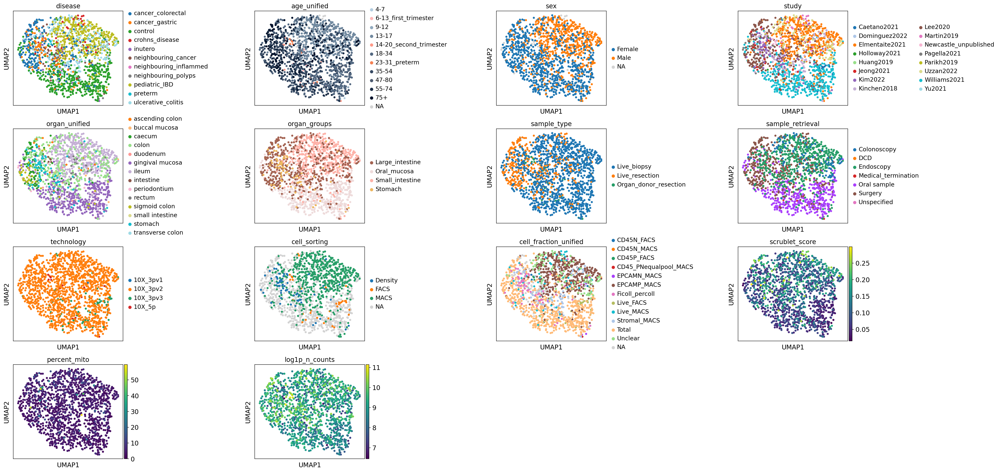

In [668]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_sub_S5,
    color=["disease", "age_unified", "sex", "study", "organ_unified", "organ_groups", "sample_type", "sample_retrieval",
           # Technical
           "technology", "cell_sorting", "cell_fraction_unified",
           # QC metrics
           "scrublet_score", "percent_mito", "log1p_n_counts"],
    wspace=1.0,
    save="_megagut_S5cells_metadata_covar"
)

In [630]:
adata_sub.obs[(adata_sub.obs.majority_voting == 'S5') & (adata_sub.obs.disease == 'control')]

,latent_cell_probability,latent_RT_efficiency,cecilia22_predH,cecilia22_predH_prob,cecilia22_predH_uncertain,cecilia22_predL,cecilia22_predL_prob,cecilia22_predL_uncertain,elmentaite21_pred,elmentaite21_pred_prob,...,MF1_prob,MF2_prob,PC_prob,S1_prob,S2_prob,S3_prob,S3x_prob,S4_prob,S5_prob,majority_voting_clear
index,,,,,,,,,,,,,,,,,,,,,
AAAGTGACACGCAAAG-GSM4600897,0.999962,1.609541,Fibroblasts,0.924673,Fibroblasts,Fibroblasts,0.972359,Fibroblasts,Stromal 4 (MMP1+),0.999874,...,5.234144e-06,1.186528e-07,8.889677e-05,3.343151e-08,5.371113e-10,1.536074e-16,2.001290e-14,4.876032e-06,1.000000,S5
AACAACCTCTTTCGAT-GSM4600897,0.999946,1.692339,Fibroblasts,0.999987,Fibroblasts,Fibroblasts,0.999997,Fibroblasts,Stromal 4 (MMP1+),0.999913,...,4.094243e-06,1.223874e-04,2.947933e-07,3.326069e-12,2.006636e-05,1.744563e-11,9.409698e-14,8.255082e-03,0.998643,S5
AAGAACATCGAATGCT-GSM4600897,0.999948,2.210231,Fibroblasts,0.999999,Fibroblasts,Fibroblasts,0.999999,Fibroblasts,Stromal 4 (MMP1+),0.999984,...,6.764226e-07,3.675990e-07,6.143539e-05,5.849581e-14,1.240062e-07,9.992431e-01,2.157993e-15,4.263482e-04,0.998649,S5
AGACACTGTTAAGCAA-GSM4600897,0.999960,2.160980,Fibroblasts,1.000000,Fibroblasts,Fibroblasts,1.000000,Fibroblasts,Stromal 4 (MMP1+),0.999623,...,1.016396e-05,1.979177e-06,4.826198e-07,6.730528e-11,1.597926e-07,8.948850e-17,2.309390e-15,1.634092e-01,1.000000,S5
AGATAGAAGAATAGTC-GSM4600897,0.999938,1.728193,Fibroblasts,0.999369,Fibroblasts,Fibroblasts,0.999995,Fibroblasts,Stromal 4 (MMP1+),0.953585,...,3.674846e-05,2.801670e-07,8.179248e-06,2.613313e-06,3.379655e-07,9.142228e-07,5.347973e-14,3.775025e-03,0.559564,S5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCACGTGTCTCATGCC-GSM5177041,0.999909,3.889136,Fibroblasts,1.000000,Fibroblasts,Fibroblasts,1.000000,Fibroblasts,Stromal 4 (MMP1+),0.489615,...,1.140185e-04,1.210254e-06,4.634195e-05,1.428617e-20,1.435041e-04,7.653711e-08,5.864827e-10,5.301023e-03,0.999026,S5
GCCCGAAGTTCTAAGC-GSM5177041,0.999952,4.254583,Fibroblasts,1.000000,Fibroblasts,Fibroblasts,1.000000,Fibroblasts,Stromal 4 (MMP1+),0.996649,...,6.228355e-08,3.170996e-07,1.076887e-05,1.021705e-19,1.146583e-08,2.441719e-01,1.901883e-18,4.335629e-07,0.951135,S5
GTCCCATCAGGTCAAG-GSM5177041,0.999896,3.244758,Fibroblasts,0.022443,Uncertain,Fibroblasts,0.002733,Uncertain,Stromal 4 (MMP1+),0.999987,...,1.364996e-07,1.914837e-06,5.139313e-08,6.101616e-13,4.604848e-03,3.705453e-12,1.370643e-11,1.522581e-04,1.000000,S5


In [628]:
adata_sub.obs.disease == 'control'

index
AAGCATCCACTCCACT-GSM4600896     True
AATGCCACAGAAACCG-GSM4600896     True
AATGGAATCGGCTGAC-GSM4600896     True
AATGGCTCACTGCTTC-GSM4600896     True
ACCAACAGTTTGAAAG-GSM4600896     True
                               ...  
TTTCCTCAGAATCTCC-GSM4546346    False
TTTGCGCCACAACGCC-GSM4546346    False
TTTGCGCGTCTCATCC-GSM4546346    False
TTTGGTTGTCAGCTAT-GSM4546346    False
TTTGTCAGTGGTGTAG-GSM4546346    False
Name: disease, Length: 198594, dtype: bool

In [472]:
def getFractions(adata_sub, column):
    # Compute normalized fractions of cell counts

    # all in subset
    fractions = pd.DataFrame(
        {'all': adata_sub.obs[column].value_counts(normalize=True, dropna=False)}
    )

    # fractions split by subtypes of fibroblasts
    fractions = fractions.join(
        pd.DataFrame(
            {x: adata_sub[adata_sub.obs.majority_voting == x].obs[column].value_counts(normalize=True, dropna=False) for x in subtypes}
        )
    )

    fractions = fractions.transpose()

    # Exclude S4 due to low identifiability
    fractions = fractions[~fractions.index.isin(['S4'])]
    
    return(fractions)

## By disease

In [589]:
fractions_disease = getFractions(adata_sub, 'disease')

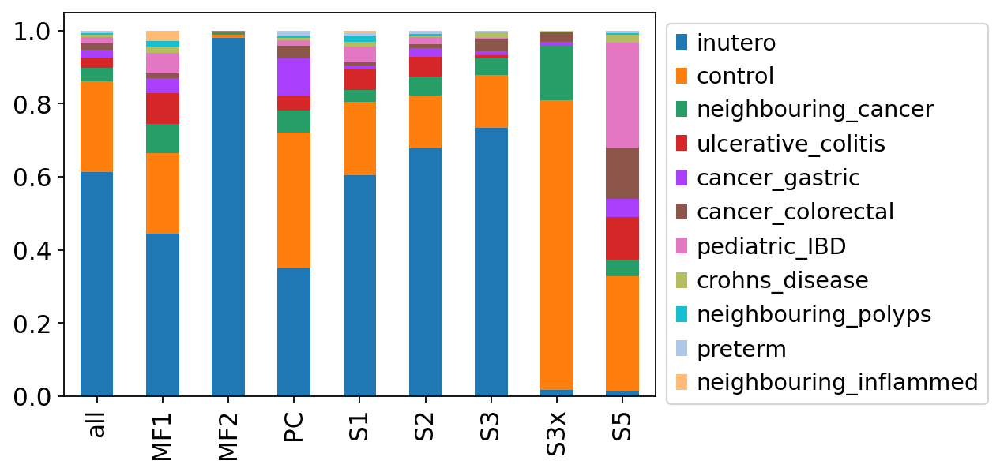

In [603]:
rcParams["figure.figsize"] = (6, 4)

ax = fractions_disease.plot.bar(stacked=True)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.grid(False)
plt.savefig("figures/barplot_megagut_fibro_celltypist_fraction_disease.pdf", bbox_inches ="tight")

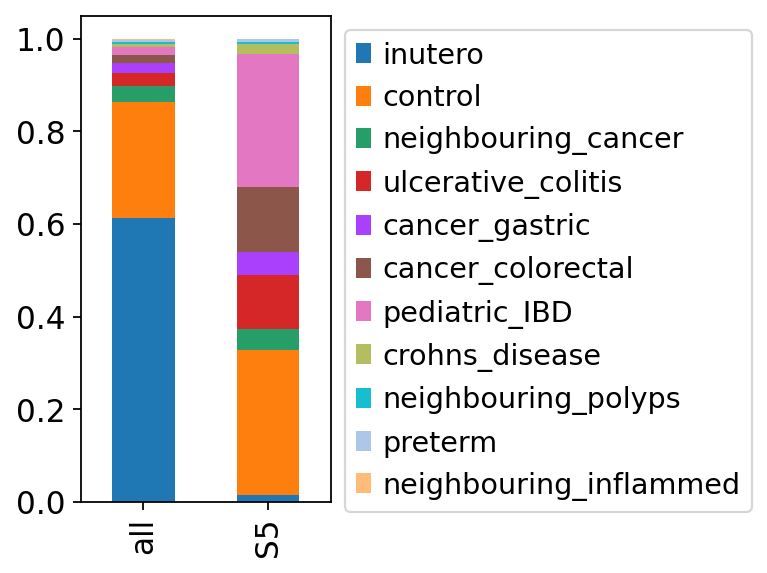

In [604]:
rcParams["figure.figsize"] = (2, 4)

ax = fractions_disease.loc[['all', 'S5'], ].plot.bar(stacked=True)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.grid(False)
plt.savefig("figures/barplot_megagut_fibro_celltypist_fraction_disease_S5.pdf", bbox_inches ="tight")

## By organ

In [478]:
fractions_organ = getFractions(adata_sub, 'organ_unified')

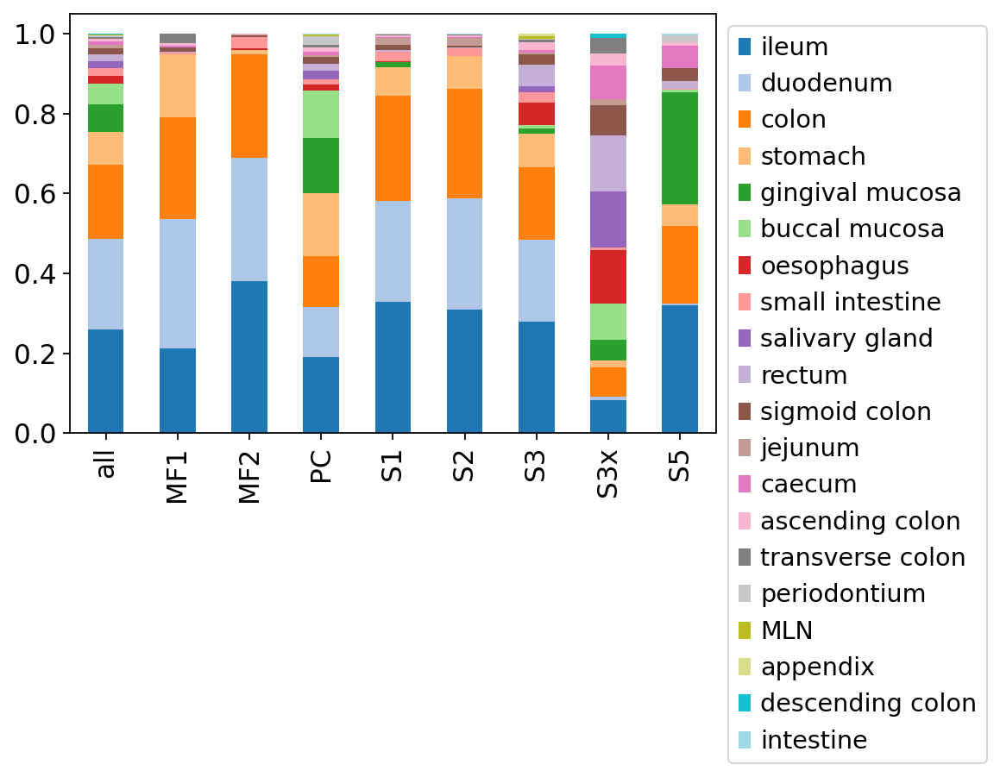

In [602]:
rcParams["figure.figsize"] = (6, 4)

ax = fractions_organ.plot.bar(stacked=True, colormap='tab20')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.grid(False)
plt.savefig("figures/barplot_megagut_fibro_celltypist_fraction_organ.pdf", bbox_inches ="tight")

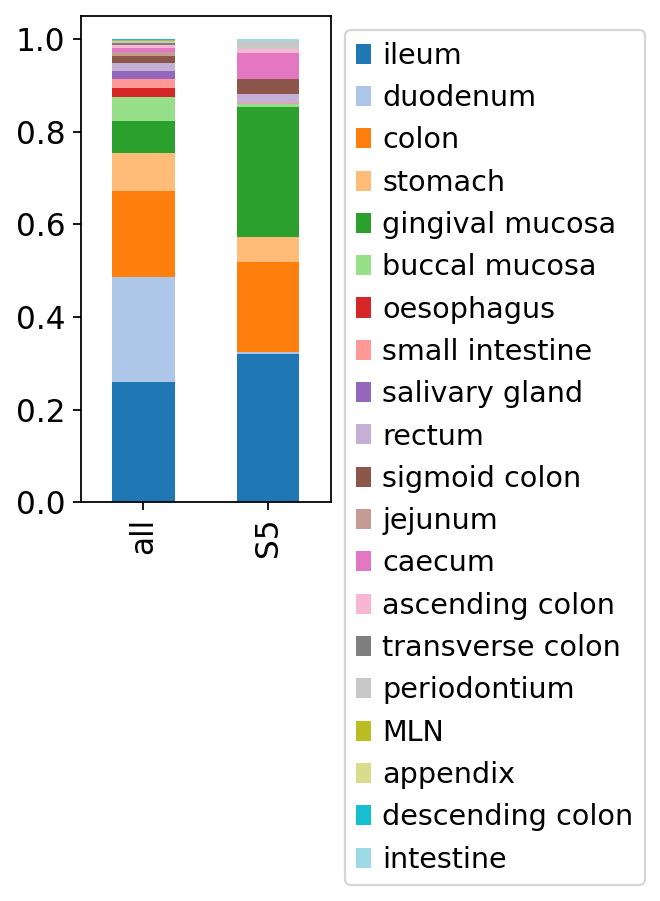

In [606]:
rcParams["figure.figsize"] = (2, 4)

ax = fractions_organ.loc[['all', 'S5'], ].plot.bar(stacked=True, colormap='tab20')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.grid(False)
plt.savefig("figures/barplot_megagut_fibro_celltypist_fraction_organ_S5.pdf", bbox_inches ="tight")

In [ ]:
print("test")